In [3]:
import h5py
import scipy
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import glob
import os
import re 
import cooltools
import cooler
# import cooltools.lib.plotting
# import matplotlib.cm as cm
from cooltools import numutils
from itertools import cycle, islice

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

from scipy import ndimage as nd
from scipy.stats import pearsonr
from scipy.signal import find_peaks
from sklearn.decomposition import PCA
from statsmodels.sandbox.stats.multicomp import multipletests as FDR
from concurrent.futures import ProcessPoolExecutor, as_completed

In [5]:
from matplotlib.colors import LinearSegmentedColormap
colors = ["white", "red"]
custom_cmap = LinearSegmentedColormap.from_list("white_to_red", colors)

In [6]:
# Define the palette (convert 0–255 RGB → 0–1)
fall_rgb = np.array([
    (255, 255, 255),
    (255, 255, 204),
    (255, 237, 160),
    (254, 217, 118),
    (254, 178, 76),
    (253, 141, 60),
    (252, 78, 42),
    (227, 26, 28),
    (189, 0, 38),
    (128, 0, 38),
    (0, 0, 0),
]) / 255.0

# Create colormap
fall_cmap = LinearSegmentedColormap.from_list(
    "fall",
    fall_rgb,
    N=256
)

In [7]:
# HiC basics metrices
# import core packages
import warnings
warnings.filterwarnings("ignore")
from itertools import combinations

# import semi-core packages
import matplotlib.pyplot as plt
from matplotlib import colors
%matplotlib inline
# plt.style.use('seaborn-poster')

# import open2c libraries
import bioframe
from matplotlib.colors import LogNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [8]:
from matplotlib.ticker import EngFormatter
bp_formatter = EngFormatter('b')
def format_ticks(ax, x=True, y=True, rotate=True):
    if y:
        ax.yaxis.set_major_formatter(bp_formatter)
    if x:
        ax.xaxis.set_major_formatter(bp_formatter)
        ax.xaxis.tick_bottom()
    if rotate:
        ax.tick_params(axis='x',rotation=45)

In [9]:
def rectangles_around_dots(dots_df, region, loc="upper", lw=1, ec="cyan", fc="none"):
    """
    yield a series of rectangles around called dots in a given region
    """
    # select dots from the region:
    df_reg = bioframe.select(
        bioframe.select(dots_df, region, cols=("chrom1","start1","end1")),
        region,
        cols=("chrom2","start2","end2"),
    )
    rectangle_kwargs = dict(lw=lw, ec=ec, fc=fc)
    # draw rectangular "boxes" around pixels called as dots in the "region":
    for s1, s2, e1, e2 in df_reg[["start1", "start2", "end1", "end2"]].itertuples(index=False):
        width1 = e1 - s1
        width2 = e2 - s2
        if loc == "upper":
            yield patches.Rectangle((s2, s1), width2, width1, **rectangle_kwargs)
        elif loc == "lower":
            yield patches.Rectangle((s1, s2), width1, width2, **rectangle_kwargs)
        else:
            raise ValueError("loc has to be uppper or lower")

In [10]:
from itertools import repeat
def moving_average(data, window_size):
    cumsum_vec = np.cumsum(np.insert(data, 0, 0)) 
    return (cumsum_vec[window_size:] - cumsum_vec[:-window_size]) / window_size

def moving_average_same_length(data, window_size):
    if window_size % 2 == 0:
        raise ValueError("Window size should be odd")
    pad_size = window_size // 2
    padded_data = np.pad(data, (pad_size, pad_size), 'edge')
    # Compute moving average using a convolution approach
    window = np.ones(int(window_size))/float(window_size)
    smoothed_data = np.convolve(padded_data, window, 'valid')
    return smoothed_data

In [11]:
### Label loops!
import matplotlib.patches as patches
def rectangles_around_dots(dots_df, region, loc="upper", lw=1, ec="cyan", fc="none"):
    """
    yield a series of rectangles around called dots in a given region
    """
    # select dots from the region:
    df_reg = bioframe.select(
        bioframe.select(dots_df, region, cols=("chrom1","start1","end1")),
        region,
        cols=("chrom2","start2","end2"),
    )
    rectangle_kwargs = dict(lw=lw, ec=ec, fc=fc)
    # draw rectangular "boxes" around pixels called as dots in the "region":
    for s1, s2, e1, e2 in df_reg[["start1", "start2", "end1", "end2"]].itertuples(index=False):
        width1 = e1 - s1
        width2 = e2 - s2
        if loc == "upper":
            yield patches.Rectangle((s2, s1), width2, width1, **rectangle_kwargs)
        elif loc == "lower":
            yield patches.Rectangle((s1, s2), width1, width2, **rectangle_kwargs)
        else:
            raise ValueError("loc has to be uppper or lower")

In [12]:
chrom_size_path = '/projects/ps-renlab2/y2xie/projects/genome_ref/hg38.main.chrom.sizes'
chrom_sizes = pd.read_csv(chrom_size_path, sep='\t', header=None, index_col=0)
nbins = np.floor(np.log2(chrom_sizes[1].values.max() / 2500) / 0.125)
bins = 2500 * np.exp2(0.125 * np.arange(nbins+1))

## Visualize raw contact matrices by predicted celltypes

In [13]:
hmeta = pd.read_csv("../04.clustering/02.RNA/03.l3_clustering/MiniAtlas_RNA_merged_dual_filt_clean_corrected_250722_metadata.txt", sep = '\t', index_col=0)
np.unique(hmeta['subclass_corrected'], return_counts=True)

(array(['ACBGM', 'AST', 'CBGA', 'ENDO', 'FBL', 'IMMUNE', 'L23IT', 'L2IT',
        'L34IT', 'L35IT', 'L45IT', 'L4IT', 'L56IT', 'L56NP', 'L5ET',
        'L5IT', 'L6B', 'L6CT', 'L6IT-1', 'L6IT-2', 'LAMP5', 'LAMP5-LHX6',
        'LRL', 'MGC', 'MSN', 'OGC', 'OPC', 'PAX6', 'PV-CHC', 'PVALB',
        'SNCG', 'SST', 'SST-CHODL', 'URL', 'VIP'], dtype=object),
 array([  5812,  32104,   7386,    670,    689,    135,  45333,  32183,
         42484,  17750,  31520,   7132,  36708,   6182,    912,   9105,
         11752,  15670,  25357,   9813,   7293,   3659,  12640,   8985,
          1421, 146861,  31774,   1327,   2955,  26757,   2554,  33943,
           708, 111650,  19853]))

In [14]:
pair_df = pd.read_csv("../06.integration/snm3c_snATAC_DPT_RNA_250601.pred_subclass_match.txt", sep = '\t')
pair_df.head()

,MiniAtlas,YELi,snm3c
0,AST,AST,ASC
1,ENDO,EC,EC
2,FBL,ASCT,VLMC
3,IMMUNE,SMC,MGC
4,L23IT,ITL23,L23_IT


## Celltype sepcfic structures

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'MATH': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'C', 'I', 'L', 'M', 'P', 'T', 'a', 'b', 'c', 'comma', 'eight', 'four', 'h', 'l', 'm', 'minus', 'nonmarkingreturn', 'o', 'one', 'period', 'r', 'seven', 'six', 'space', 'three', 'two', 'underscore', 'v', 'w', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 15, 17, 19, 20, 21, 22, 23, 25, 26, 27, 38, 44, 47, 48, 51, 55, 66, 68, 69, 70, 75, 79, 80, 82, 85, 89, 90, 3228]
INFO:fontTools.subset:Closed glyph list over 'MATH': 32 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null'

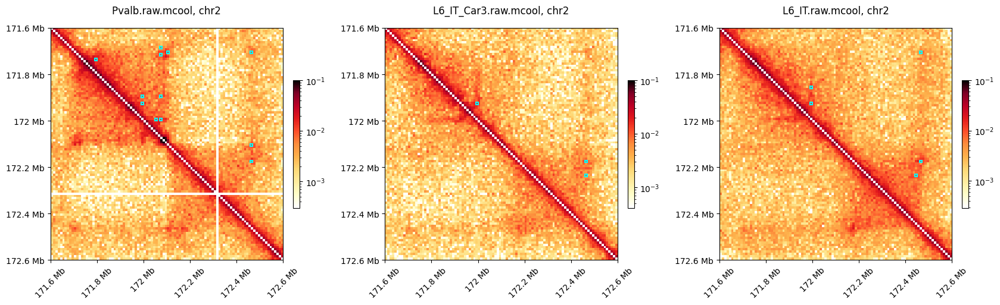

In [16]:
ipath = "/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/mcool/raw/"
res = 10_000
scale = 0.1

chrom = 'chr2'
start, end = 171_600_000, 172_600_000
region = (chrom, start, end)
    
f, axes = plt.subplots(1, 3, figsize=(17, 5))
for idx, sample in enumerate(['Pvalb.raw.mcool', 'L6_IT_Car3.raw.mcool', 'L6_IT.raw.mcool']): ### similar cell number
    sname = sample.replace(".raw.mcool", "")
    loop = pd.read_csv(f'/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/loop/FitHiC_filter/{sname}.loop.bedpe', sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2"], index_col=False)
    clr = cooler.Cooler(ipath + sample + f'::resolutions/{res}')
    mtx = clr.matrix(balance=True).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[idx]
    im = ax.matshow(mtx, cmap=fall_cmap, norm=LogNorm(vmax = scale), 
                    # extent=(0, clr.chromsizes[chrom], clr.chromsizes[chrom], 0))
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
    
    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()
plt.savefig(f"../Figure/FIG_Pvalb_L6IT_dots_example_DLX1_chr2_171-6_172-6.pdf")

## Train peakachu model on calling longrange loop

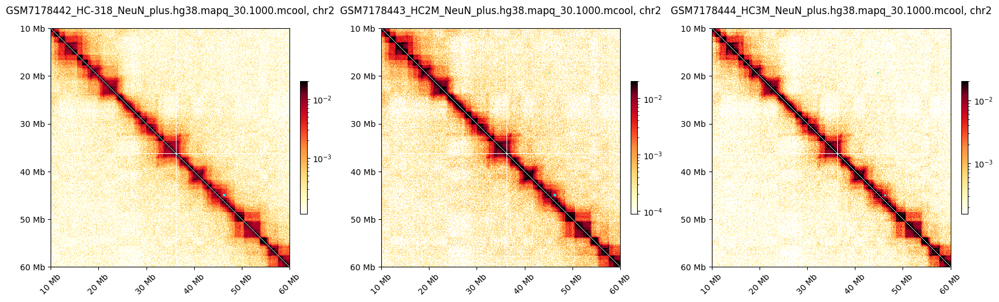

In [58]:
### show reference loops
chrom = 'chr2'
start, end = 10_000_000, 60_000_000
region = (chrom, start, end)

res = 100_000
scale = 300

### Check reference
f, axes = plt.subplots(1, 3, figsize=(17, 5))
for idx, sample in enumerate(['GSM7178442_HC-318_NeuN_plus.hg38.mapq_30.1000.mcool', 'GSM7178443_HC2M_NeuN_plus.hg38.mapq_30.1000.mcool', 'GSM7178444_HC3M_NeuN_plus.hg38.mapq_30.1000.mcool']): ### similar cell number
    sname = sample.split(".")[0]
    clr = cooler.Cooler("/projects/ps-renlab2/y2xie/projects/BICAN/ref/Pletenev2024NAR/" + sample + f'::resolutions/{res}')
    loop = pd.read_csv('/projects/ps-renlab2/y2xie/projects/BICAN/ref/Pletenev2024NAR/GSE229816_fithic.h3k27me3.NeuN+.hi-c_merged.res-100kb.bedpe', sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2"], index_col=False)
    mtx = clr.matrix(balance=True).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[idx]
    im = ax.matshow(mtx, cmap="fall", norm=LogNorm(vmax = 0.02), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
    
    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()

## Plot peakachu prediction

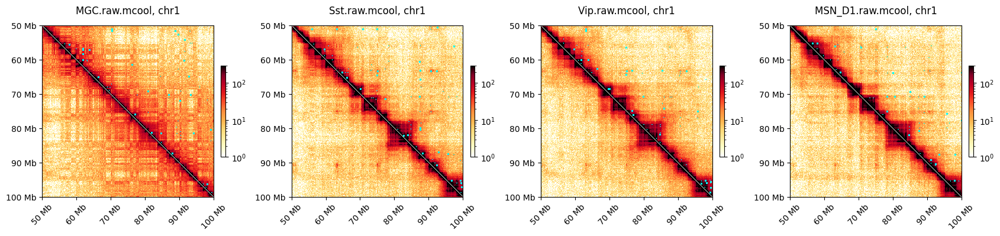

In [11]:
ipath = "/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/mcool/raw/"

### -t 0.85 for peakachu pool
chrom = 'chr1'
start, end = 50_000_000, 100_000_000
region = (chrom, start, end)

res = 100_000
scale = 300

f, axes = plt.subplots(1, 4, figsize=(17, 4))
for idx, sample in enumerate(['MGC.raw.mcool', 'Sst.raw.mcool', 'Vip.raw.mcool', 'MSN_D1.raw.mcool']): ### similar cell number
    sname = sample.split(".")[0]
    clr = cooler.Cooler(ipath + sample + f'::resolutions/{res}')
    loop = pd.read_csv(f'/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/peakachu/prediction/{sname}_{chrom}.loops.bedpe', sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2", "score1", "score2"], index_col=False)
    mtx = clr.matrix(balance=None).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[idx]
    im = ax.matshow(mtx, cmap="fall", norm=LogNorm(vmax = scale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
    
    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()

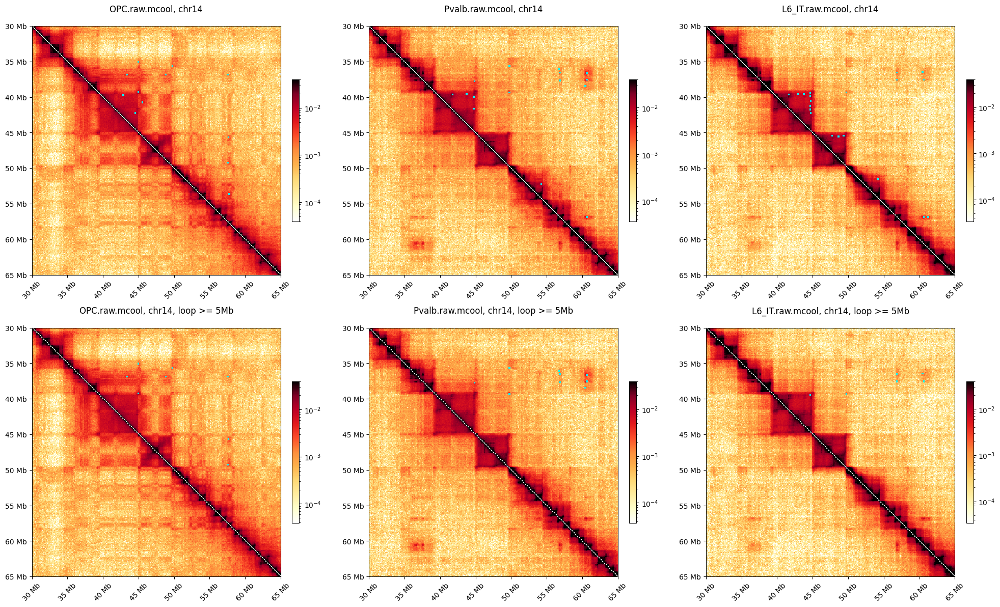

In [75]:
### Plot peakachu + fithic2 filtering
chrom = 'chr14'
start, end = 30_000_000, 65_000_000
region = (chrom, start, end)

res = 100_000
scale = 0.04

f, axes = plt.subplots(2, 3, figsize=(20, 12))
for idx, sample in enumerate(['OPC.raw.mcool', 'Pvalb.raw.mcool', 'L6_IT.raw.mcool']): ### similar cell number
    sname = sample.split(".")[0]
    clr = cooler.Cooler(ipath + sample + f'::resolutions/{res}')
    loop = pd.read_csv(f'/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/peakachu/FitHiC/fithic_filter/q10-10/{sname}.loops.bedpe', sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2", "score1", "score2"], index_col=False)
    
    mtx = clr.matrix(balance=True).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[0, idx]
    im = ax.matshow(mtx, cmap="fall", norm=LogNorm(vmax = scale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
 
    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

     ### filter contacts
    loop = loop.loc[loop['end2'] - loop['end1'] >= 5_000_000]
    ax = axes[1, idx]
    im = ax.matshow(mtx, cmap="fall", norm=LogNorm(vmax = scale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
 
    ax.set_title(sample + ", " + chrom + ", loop >= 5Mb", y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()

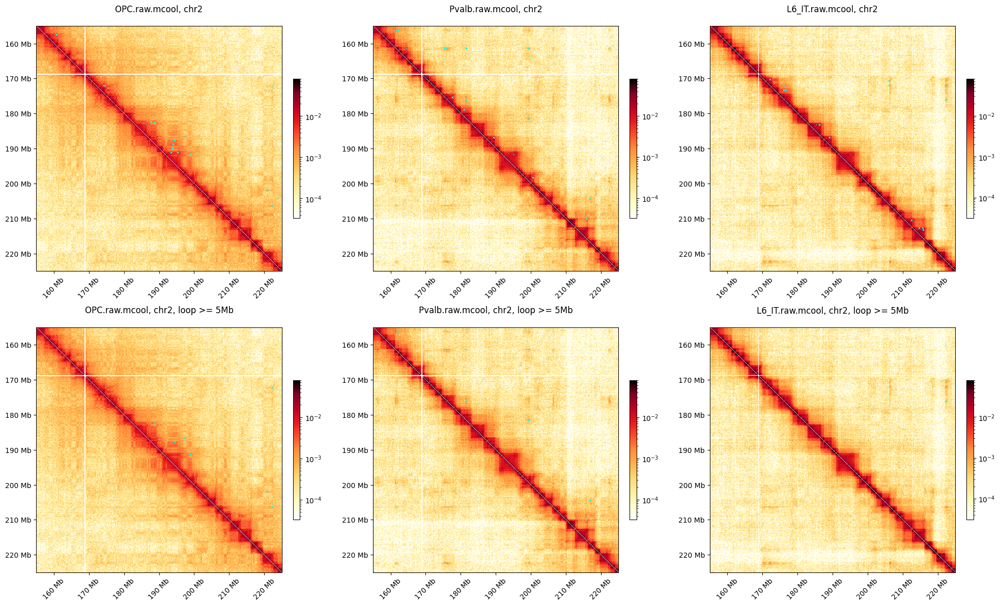

In [84]:
chrom = 'chr2'
start, end = 155_000_000, 225_000_000
region = (chrom, start, end)

res = 100_000
scale = 0.08

f, axes = plt.subplots(2, 3, figsize=(20, 12))
for idx, sample in enumerate(['OPC.raw.mcool', 'Pvalb.raw.mcool', 'L6_IT.raw.mcool']): ### similar cell number
    sname = sample.split(".")[0]
    clr = cooler.Cooler(ipath + sample + f'::resolutions/{res}')
    loop = pd.read_csv(f'/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/peakachu/FitHiC/fithic_filter/q10-7/{sname}.loops.bedpe', sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2", "score1", "score2"], index_col=False)
    
    mtx = clr.matrix(balance=True).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[0, idx]
    im = ax.matshow(mtx, cmap="fall", norm=LogNorm(vmax = scale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
 
    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

     ### filter contacts
    loop = loop.loc[loop['end2'] - loop['end1'] >= 5_000_000]
    ax = axes[1, idx]
    im = ax.matshow(mtx, cmap="fall", norm=LogNorm(vmax = scale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
 
    ax.set_title(sample + ", " + chrom + ", loop >= 5Mb", y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()

## Use 5Mb, peakachu prob 0.85 & fithic q value 10^-7 to filter out super long ranges

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'I', 'L', 'M', 'P', 'T', 'a', 'b', 'c', 'comma', 'eight', 'four', 'h', 'l', 'm', 'minus', 'nine', 'nonmarkingreturn', 'o', 'one', 'period', 'r', 'seven', 'six', 'space', 'three', 'two', 'underscore', 'v', 'w', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 15, 17, 19, 20, 21, 22, 23, 25, 26, 27, 28, 44, 47, 48, 51, 55, 66, 68, 69, 70, 75, 79, 80, 82, 85, 89, 90, 3228]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 32 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.nu

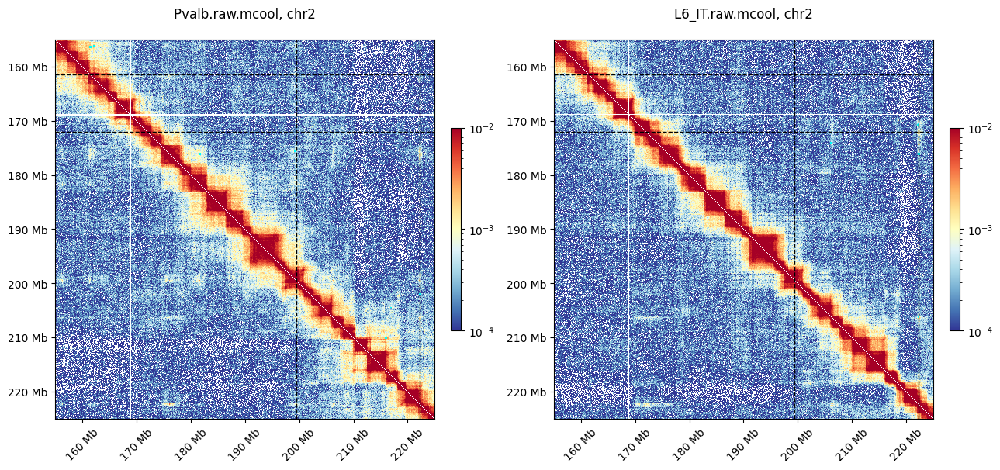

In [106]:
## Plot example
chrom = 'chr2'
start, end = 155_000_000, 225_000_000
region = (chrom, start, end)

res = 100_000
scale = 0.01
lscale = 0.0001

### 
ctl0, ctl1, ctl2, ctl3 = 161400000, 172000000, 222300000, 199400000
# x0, y0 = int((ctl1-start)/res), int((ctl2-start)/res)

f, axes = plt.subplots(1, 2, figsize=(13, 6))
for idx, sample in enumerate(['Pvalb.raw.mcool', 'L6_IT.raw.mcool']): ### similar cell number
    sname = sample.split(".")[0]
    loop = pd.read_csv(f'/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/peakachu/FitHiC/fithic_filter/q10-7/{sname}.loops.bedpe', sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2", "score1", "score2"], index_col=False)
    loop = loop.loc[loop['end2'] - loop['end1'] >= 5_000_000]
    clr = cooler.Cooler(ipath + sample + f'::resolutions/{res}')
    mtx = clr.matrix(balance=True).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[idx]
    im = ax.matshow(mtx, cmap="RdYlBu_r", norm=LogNorm(vmax = scale, vmin = lscale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)

    
    ax.axvline(x=ctl2, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=ctl3, color='black', linestyle='--', linewidth=1)
    ax.axhline(y=ctl0, color='black', linestyle='--', linewidth=1)
    ax.axhline(y=ctl1, color='black', linestyle='--', linewidth=1)

    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()
plt.savefig(f"../Figure/FIG_Pvalb_L6IT_dots_example_chr2.pdf")

In [20]:
hg38_chromsizes = bioframe.fetch_chromsizes('hg38')
hg38_cens = bioframe.fetch_centromeres('hg38')
hg38_arms = bioframe.make_chromarms(hg38_chromsizes, hg38_cens)

hg38_arms = hg38_arms.set_index("chrom").loc[clr.chromnames].reset_index()

In [24]:
# ipath = "/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/mcool/raw/"
flist = ['Pvalb.raw.mcool', 'L6_IT.raw.mcool'] #[file for file in os.listdir(ipath) if file.endswith(".raw.mcool")]
flank = 1_000_000

f, axes = plt.subplots(30, 30, figsize=(40, 40))
for idx, sample in enumerate(flist): 
    sname = sample.split(".")[0]
    clr = cooler.Cooler(ipath + sample + f'::resolutions/{res}')
    expected = cooltools.expected_cis(clr, view_df=hg38_arms, nproc=2, chunksize=1_000_000)
    for idy, ssample in enumerate(flist):
        ssname = ssample.split(".")[0]
        loop = pd.read_csv(f'/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/peakachu/FitHiC/fithic_filter/q10-7/{ssname}.loops.bedpe', sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2", "score1", "score2"], index_col=False)
        loop = loop.loc[loop['end2'] - loop['end1'] >= 5_000_000]
        loop.loc[:, 'mid1'] = (loop['start1'] + loop['end1'])//2
        loop.loc[:, 'mid2'] = (loop['start2'] + loop['end2'])//2
        
        stack = cooltools.pileup(clr, loop, view_df=hg38_arms, expected_df=expected, flank=flank)
        mtx = np.nanmean(stack, axis=0)
        pd.DataFrame(mtx).to_csv(f"{sname}_over_SLR_{ssname}.pileup.csv")
        ax = axes[idx, idy]
        im = ax.imshow(
            np.log2(mtx),
            vmax = 3,
            vmin = -0.5,
            cmap='coolwarm')
        # plt.colorbar(im, label = 'log2 mean obs/exp', fraction=0.025, pad=0.04, ax = ax)
        ax.set_title(sname + " over " + ssname, y=1.04)
        
        ticks_pixels = np.linspace(0, flank*2//res,5)
        ticks_kbp = ((ticks_pixels-ticks_pixels[-1]/2)*res//1000).astype(int)
        plt.xticks(ticks_pixels, ticks_kbp)
        plt.yticks(ticks_pixels, ticks_kbp)
        plt.xlabel('relative position, kbp')
        plt.ylabel('relative position, kbp')
        
plt.tight_layout()

# plt.savefig(f"../Figure/FIG_all_subclass_superlongrange_pileup_OvE.pdf")

INFO:root:creating a Pool of 2 workers
INFO:root:creating a Pool of 2 workers


In [213]:
hg38_chromsizes = bioframe.fetch_chromsizes('hg38')
hg38_cens = bioframe.fetch_centromeres('hg38')

hg38_arms = bioframe.make_chromarms(hg38_chromsizes,  hg38_cens)
hg38_arms = hg38_arms[hg38_arms.chrom.isin(['chr' + str(i) for i in range(1, 23)])].reset_index(drop=True)

In [128]:
flist = [f for f in os.listdir(ipath) if f.endswith('mcool')]
res = 10_000
cdk = []
for ctf in flist:
    cname = ctf.split(".")[0]
    clr = cooler.Cooler(f"{ipath}/{ctf}::resolutions/{res}")
    dcay = cooltools.expected_cis(clr, hg38_arms, intra_only=True, 
                                  smooth=True, aggregate_smoothed=True, smooth_sigma=0.1, 
                                  clr_weight_name='weight', ignore_diags=1, chunksize=10000000, nproc=16)
    dcay['celltype'] = cname
    cdk.append(dcay)
    
cdk = pd.concat(cdk, axis=0, ignore_index=True)
cdk.to_csv(f"{ipath}/Subclass_cooltools_decay.csv")

INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers
INFO:root:creating a Pool of 16 workers


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 47 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'H', 'I', 'L', 'N', 'P', 'S', 'T', 'V', 'a', 'b', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'q', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 15, 19, 20, 21, 22, 23, 24, 25, 26, 27, 38, 39, 40, 43, 44, 47, 49, 51, 54, 55, 57, 66, 68, 69, 70, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 

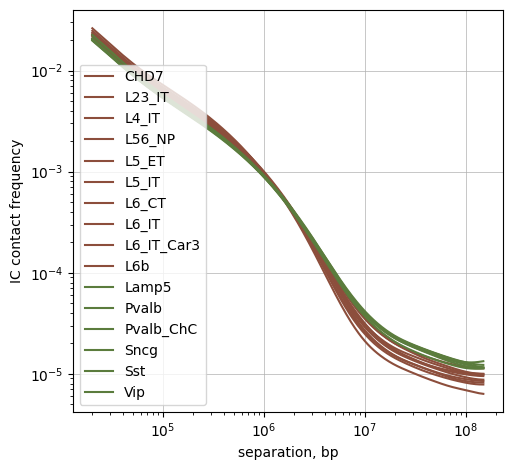

In [177]:
### Plot only neurons?
f, ax = plt.subplots(1,1)
qct = np.unique(hmeta.loc[hmeta['class'] == "Glut"].subclass_corrected)
qct = pair_df.loc[pair_df['MiniAtlas'].isin(qct)]['snm3c']
qct1 = np.intersect1d(qct, np.unique(cdk['celltype']))

qct = np.unique(hmeta.loc[hmeta['class'] == "GABA"].subclass_corrected)
qct = pair_df.loc[pair_df['MiniAtlas'].isin(qct)]['snm3c']
qct2 = np.intersect1d(qct, np.unique(cdk['celltype']))

for ctf in np.concatenate((qct1, qct2)):
    if ctf in qct1:
        qcol = '#8C4E3C'
    else:
        qcol = '#5B7C3D'
    
    cvd_smooth_agg = cdk.loc[cdk['celltype'] == ctf]
    cvd_smooth_agg['dist_bp'] = cvd_smooth_agg['dist'] * res
    cvd_smooth_agg['balanced.avg.smoothed.agg'].loc[cvd_smooth_agg['dist'] < 2] = np.nan
    qarm = cvd_smooth_agg['region1'].mode().iloc[0]
    qdf = cvd_smooth_agg.loc[cvd_smooth_agg['region1'] == qarm]

    ax.loglog(qdf['dist_bp'].loc[qdf['region2'] == qarm],
              qdf['balanced.avg.smoothed.agg'].loc[qdf['region2'] == qarm], 
              label = ctf, color=qcol)
    
ax.legend()
ax.set(xlabel='separation, bp', ylabel='IC contact frequency')
ax.set_aspect(1.0)
ax.grid(lw=0.5)
plt.tight_layout()
plt.savefig(f"plot/FIG_neuronal_subclass_decay_raw_10kb.pdf")

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 41 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'C', 'I', 'L', 'N', 'O', 'P', 'S', 'T', 'V', 'a', 'b', 'c', 'comma', 'e', 'eight', 'f', 'five', 'four', 'i', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'q', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 15, 19, 20, 21, 22, 23, 24, 25, 26, 27, 36, 38, 44, 47, 49, 50, 51, 54, 55, 57, 66, 68, 69, 70, 72, 73, 76, 81, 82, 83, 84, 85, 86, 87, 88, 92, 3228]
INFO:fontTools.subset:Closed glyph list over

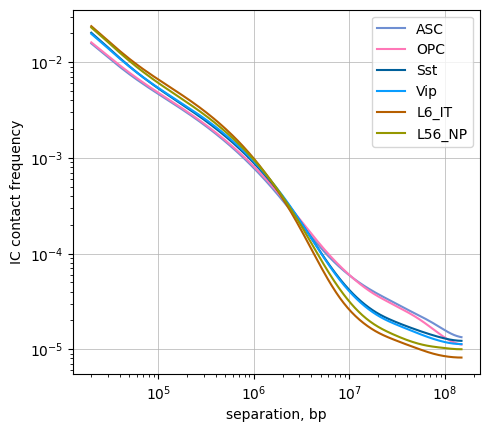

In [159]:
### Plot only representative celltypes?
f, ax = plt.subplots(figsize=(5, 5))
qct = ['ASC', 'OPC', 'Sst', 'Vip', 'L6_IT', 'L56_NP']
ccol2 = ['#6f8fd2', '#ff77b7', '#00609b', '#099dff', '#b65f00', '#959700']
for ctf in qct:
    qcol = ccol2[qct.index(ctf)]
    cvd_smooth_agg = cdk.loc[cdk['celltype'] == ctf]
    cvd_smooth_agg['dist_bp'] = cvd_smooth_agg['dist'] * res
    cvd_smooth_agg['balanced.avg.smoothed.agg'].loc[cvd_smooth_agg['dist'] < 2] = np.nan
    qarm = cvd_smooth_agg['region1'].mode().iloc[0]
    qdf = cvd_smooth_agg.loc[cvd_smooth_agg['region1'] == qarm]

    ax.loglog(qdf['dist_bp'].loc[qdf['region2'] == qarm],
              qdf['balanced.avg.smoothed.agg'].loc[qdf['region2'] == qarm], 
              label = ctf, color=qcol)
    
ax.legend()
ax.set(xlabel='separation, bp', ylabel='IC contact frequency')
ax.set_aspect(1.0)
ax.grid(lw=0.5)
plt.tight_layout()
plt.savefig(f"plot/FIG_representative_subclass_decay_raw_10kb.pdf")

### Plot regions with finemapped variants

In [71]:
pair_df

,MiniAtlas,YELi,snm3c
0,AST,AST,ASC
1,ENDO,EC,EC
2,FBL,ASCT,VLMC
3,IMMUNE,SMC,MGC
4,L23IT,ITL23,L23_IT
5,L2IT,ITL23,L23_IT
6,L34IT,ITV1C,L23_IT
7,L35IT,ITL34,L4_IT
8,L45IT,ITL4,L4_IT
9,L4IT,ITV1C,L23_IT


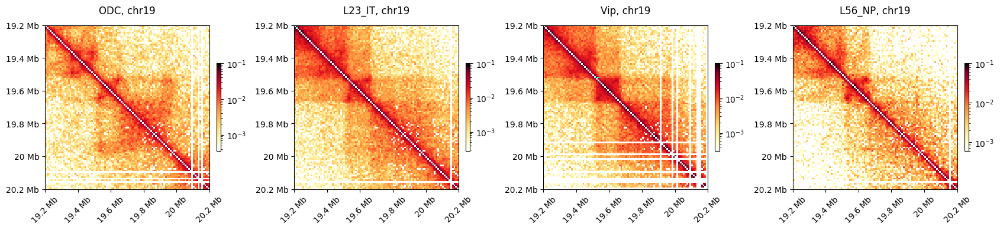

In [84]:
ipath = "/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/mcool/raw/"

chrom = 'chr19'
start, end = 19_200_000, 20_200_000
region = (chrom, start, end)

res = 10_000
scale = 0.1

f, axes = plt.subplots(1, 4, figsize=(17, 4))
for idx, sample in enumerate(['ODC', 'L23_IT', 'Vip', 'L56_NP']): 
    qsample = ['OGC', 'L23IT', 'VIP', 'L56NP'][idx]
    clr = cooler.Cooler(ipath + sample + '.raw.mcool' + f'::resolutions/{res}')
    loop = pd.read_csv(f'/projects/ps-renlab2/y2xie/public_html/BICAN/MiniAtlas_subclass/broad_abc/{qsample}_filter.bedpe', 
                       sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2"], index_col=False)
    mtx = clr.matrix(balance=True).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[idx]
    im = ax.matshow(mtx, cmap=fall_cmap, norm=LogNorm(vmax = scale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
    
    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()

### Contact with CELF1 seems specific in excitatory

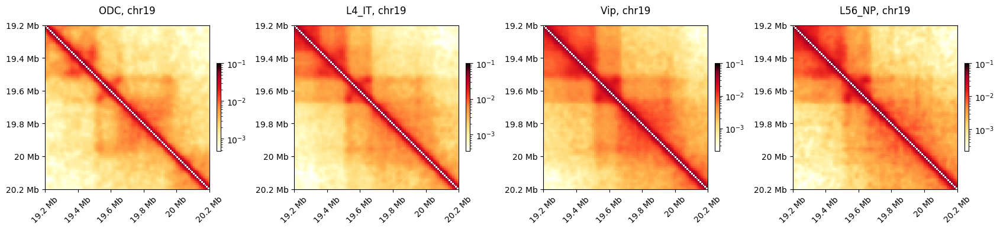

In [83]:
ipath = "/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/mcool/Q/"

res = 10_000
scale = 0.1

f, axes = plt.subplots(1, 4, figsize=(17, 4))
for idx, sample in enumerate(['ODC', 'L4_IT', 'Vip', 'L56_NP']): 
    qsample = pair_df.loc[pair_df['snm3c'] == sample]['MiniAtlas'].values[0]
    clr = cooler.Cooler(ipath + sample + '.Q.cool' + f'::/')
    mtx = clr.matrix(balance=False).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[idx]
    im = ax.matshow(mtx, cmap=fall_cmap, norm=LogNorm(vmax = scale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    
    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()

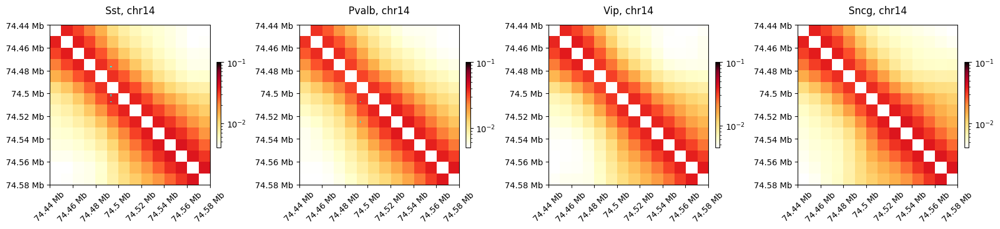

In [87]:
ipath = "/projects/ps-renlab2/y2xie/projects/BICAN/ref/hba_snm3c/mcool/Q/"

chrom = 'chr14'
start, end = 74_440_000, 74_580_000
region = (chrom, start, end)

res = 10_000
scale = 0.1

f, axes = plt.subplots(1, 4, figsize=(17, 4))
for idx, sample in enumerate(['Sst', 'Pvalb', 'Vip', 'Sncg']): 
    qsample = ['SST', 'PVALB', 'VIP', 'SNCG'][idx]
    clr = cooler.Cooler(ipath + sample + '.Q.cool' + f'::/')
    loop = pd.read_csv(f'/projects/ps-renlab2/y2xie/public_html/BICAN/MiniAtlas_subclass/broad_abc/{qsample}_filter.bedpe', 
                       sep = '\t', names = ["chrom1","start1","end1", "chrom2","start2","end2"], index_col=False)
    mtx = clr.matrix(balance=False).fetch(region)
    mtx = mtx - np.diag(np.diag(mtx))
    ax = axes[idx]
    im = ax.matshow(mtx, cmap=fall_cmap, norm=LogNorm(vmax = scale), 
                    extent=(start, end, end, start))
    format_ticks(ax)
    for box in rectangles_around_dots(loop, region, lw=1.5):
        ax.add_patch(box)
    
    ax.set_title(sample + ", " + chrom, y=1.04)
    plt.colorbar(im, fraction=0.025, pad=0.04, ax = ax)

plt.tight_layout()

